In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from warnings import filterwarnings
filterwarnings('ignore')                       #  <---- to ignore warnings

In [2]:
# Read file
zomato_df=pd.read_csv(r'C:\Users\pawan\Desktop\work\Zomato Data Analysis\3-Zomato Data Analysis\zomato.csv')
zomato_df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [3]:
zomato_df.shape

(51717, 17)

In [4]:
zomato_df.dtypes

url                            object
address                        object
name                           object
online_order                   object
book_table                     object
rate                           object
votes                           int64
phone                          object
location                       object
rest_type                      object
dish_liked                     object
cuisines                       object
approx_cost(for two people)    object
reviews_list                   object
menu_item                      object
listed_in(type)                object
listed_in(city)                object
dtype: object

In [5]:
unique_restaurent_names = zomato_df['name'].unique()

In [6]:
len(unique_restaurent_names)

8792

In [7]:
zomato_df.isna().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [8]:
# list of features that contain null values

In [9]:
features_contain_nan = [feature for feature in zomato_df.columns if zomato_df[feature].isnull().sum()>0]

In [10]:
features_contain_nan

['rate',
 'phone',
 'location',
 'rest_type',
 'dish_liked',
 'cuisines',
 'approx_cost(for two people)']

In [11]:
# percentage of missing values in features containing nane values

In [12]:
for feature in features_contain_nan:
    print(' {} has {:.2f} % empty values'.format(feature,zomato_df[feature].isnull().sum()/len(zomato_df)*100))

 rate has 15.03 % empty values
 phone has 2.34 % empty values
 location has 0.04 % empty values
 rest_type has 0.44 % empty values
 dish_liked has 54.29 % empty values
 cuisines has 0.09 % empty values
 approx_cost(for two people) has 0.67 % empty values


In [13]:
zomato_df['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [14]:
zomato_df.dropna(axis='index',subset=['rate'],inplace=True)

In [15]:
zomato_df.shape

(43942, 17)

In [16]:
def split(x):
    return x.split('/')[0]

In [17]:
zomato_df['rate'] = zomato_df['rate'].apply(split)

In [18]:
zomato_df['rate']

0         4.1
1         4.1
2         3.8
3         3.7
4         3.8
         ... 
51709    3.7 
51711    2.5 
51712    3.6 
51715    4.3 
51716    3.4 
Name: rate, Length: 43942, dtype: object

In [19]:
zomato_df['rate'].unique()

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', 'NEW', '2.9', '3.5',
       '2.6', '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2',
       '2.3', '3.4 ', '-', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ',
       '3.7 ', '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ',
       '3.2 ', '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '4.6 ', '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ',
       '2.2 ', '2.0 ', '1.8 '], dtype=object)

In [20]:
zomato_df['rate'].replace('NEW',0,inplace=True)
zomato_df['rate'].replace('-',0,inplace=True)

In [21]:
zomato_df['rate'].unique()

array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', 0, '2.9', '3.5', '2.6',
       '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2', '2.3',
       '3.4 ', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ', '3.7 ',
       '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ', '3.2 ',
       '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8', '4.6 ',
       '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ', '2.2 ',
       '2.0 ', '1.8 '], dtype=object)

In [22]:
zomato_df['rate']=zomato_df['rate'].astype(float)

In [23]:
zomato_df.dtypes

url                             object
address                         object
name                            object
online_order                    object
book_table                      object
rate                           float64
votes                            int64
phone                           object
location                        object
rest_type                       object
dish_liked                      object
cuisines                        object
approx_cost(for two people)     object
reviews_list                    object
menu_item                       object
listed_in(type)                 object
listed_in(city)                 object
dtype: object

In [24]:
# Calculate average rating of each restaurant

<AxesSubplot:xlabel='name'>

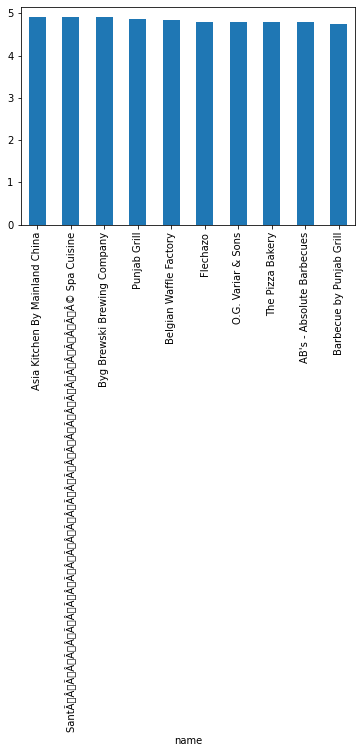

In [25]:
zomato_df.groupby('name')['rate'].mean().nlargest(10).plot.bar()

In [26]:
zomato_df_rate=zomato_df.groupby('name')['rate'].mean().to_frame()
zomato_df_rate=zomato_df_rate.reset_index()
zomato_df_rate.columns=['restaurant_name','rating']

In [27]:
zomato_df_rate

,restaurant_name,rating
0,#FeelTheROLL,3.400000
1,#L-81 Cafe,3.900000
2,#refuel,3.700000
3,1000 B.C,3.200000
4,100ÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ°C,3.700000
...,...,...
7157,i-Bar - The Park Bangalore,3.800000
7158,iFruit Live Ice Creams,3.400000
7159,iSpice Resto Cafe,3.700000
7160,nu.tree,4.314286


In [28]:
zomato_df_rate.shape

(7162, 2)

In [29]:
# Rating distribution

<AxesSubplot:xlabel='rating', ylabel='Density'>

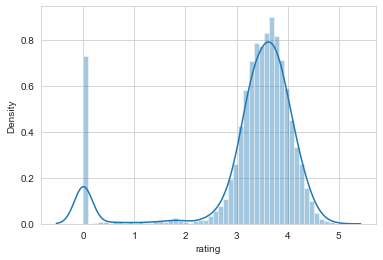

In [30]:
sns.set_style(style='whitegrid')
sns.distplot(zomato_df_rate['rating'])

In [31]:
''' conclusion : Almost more than 50 percent of restaurants has rating between 3 and 4. Restaurants having rating more than 4.5 are very rare. '''

' conclusion : Almost more than 50 percent of restaurants has rating between 3 and 4. Restaurants having rating more than 4.5 are very rare. '

In [32]:
# Which are the top restaurant chains in Bangaluru?

Text(0.5, 0, 'Number of outlets')

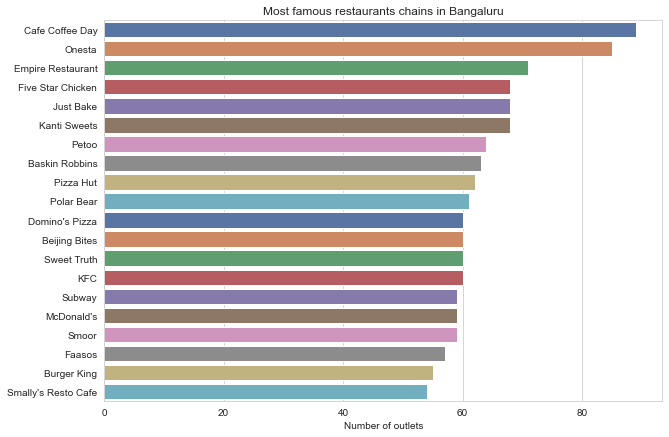

In [33]:
plt.figure(figsize=(10,7))
chains=zomato_df['name'].value_counts()[0:20]
sns.barplot(x=chains,y=chains.index,palette='deep')
plt.title("Most famous restaurants chains in Bangaluru")
plt.xlabel("Number of outlets") 

In [34]:
# How many of the restuarants do not accept online orders?

([<matplotlib.patches.Wedge at 0x6cb0fa0>,
 [Text(-0.481488774517003, 0.9890240442042423, ''),
  Text(0.5252605823084886, -1.0789352717716423, '')],
 [Text(-0.26263024064563795, 0.5394676604750411, '64.4%'),
  Text(0.30640200634661835, -0.629378908533458, '35.6%')])

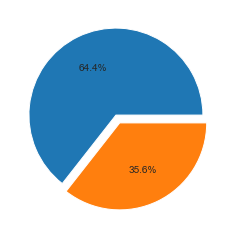

In [35]:
x=zomato_df['online_order'].value_counts()
labels=['accepted','not accepted']
plt.pie(x,explode=[0.0,0.1],autopct='%1.1f%%')

In [36]:
# using plotly, How many of the restuarants do not accept online orders?

In [37]:
fig = px.pie(zomato_df, values=x, names=labels,title='Pie chart')
fig.show()

In [38]:
# What is the ratio b/w restaurants that provide and do not provide table booking ?

([<matplotlib.patches.Wedge at 0x3cc6fcd0>,
 [Text(-0.9856961240827233, 0.4882654513359477, ''),
  Text(1.0753048626356982, -0.5326532196392153, '')],
 [Text(-0.537652431317849, 0.26632660981960776, '85.4%'),
  Text(0.6272611698708239, -0.31071437812287556, '14.6%')])

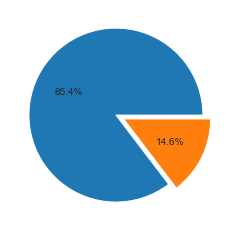

In [39]:
booking=zomato_df['book_table'].value_counts()
booking_labels=['no booking','booking']
plt.pie(booking,explode=[0.0,0.1],autopct='%1.1f%%')

In [40]:
# using plotly, #### What is the ratio b/w restaurants that provide and do not provide table booking ?

In [41]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [42]:
booking=zomato_df['book_table'].value_counts()
booking_labels=['not book','book']

In [43]:
trace=go.Pie(labels=booking_labels, values=booking,
               hoverinfo='label+percent', textinfo='value', 
               textfont=dict(size=25),
              pull=[0, 0, 0,0.2, 0]
               )

In [44]:
iplot([trace])

In [45]:
# How many types of restaurants we have?

In [46]:
zomato_df['rest_type'].isna().sum()

151

In [47]:
zomato_df['rest_type'].dropna(inplace=True)

In [48]:
zomato_df['rest_type'].unique()

array(['Casual Dining', 'Cafe, Casual Dining', 'Quick Bites',
       'Casual Dining, Cafe', 'Cafe', 'Quick Bites, Cafe',
       'Cafe, Quick Bites', 'Delivery', 'Mess', 'Dessert Parlor',
       'Bakery, Dessert Parlor', 'Pub', 'Bakery', 'Takeaway, Delivery',
       'Fine Dining', 'Beverage Shop', 'Sweet Shop', 'Bar',
       'Dessert Parlor, Sweet Shop', 'Bakery, Quick Bites',
       'Sweet Shop, Quick Bites', 'Kiosk', 'Food Truck',
       'Quick Bites, Dessert Parlor', 'Beverage Shop, Quick Bites',
       'Beverage Shop, Dessert Parlor', 'Takeaway', 'Pub, Casual Dining',
       'Casual Dining, Bar', 'Dessert Parlor, Beverage Shop',
       'Quick Bites, Bakery', 'Microbrewery, Casual Dining', 'Lounge',
       'Bar, Casual Dining', 'Food Court', 'Cafe, Bakery', nan, 'Dhaba',
       'Quick Bites, Sweet Shop', 'Microbrewery',
       'Food Court, Quick Bites', 'Quick Bites, Beverage Shop',
       'Pub, Bar', 'Casual Dining, Pub', 'Lounge, Bar',
       'Dessert Parlor, Quick Bites', 'Food Co

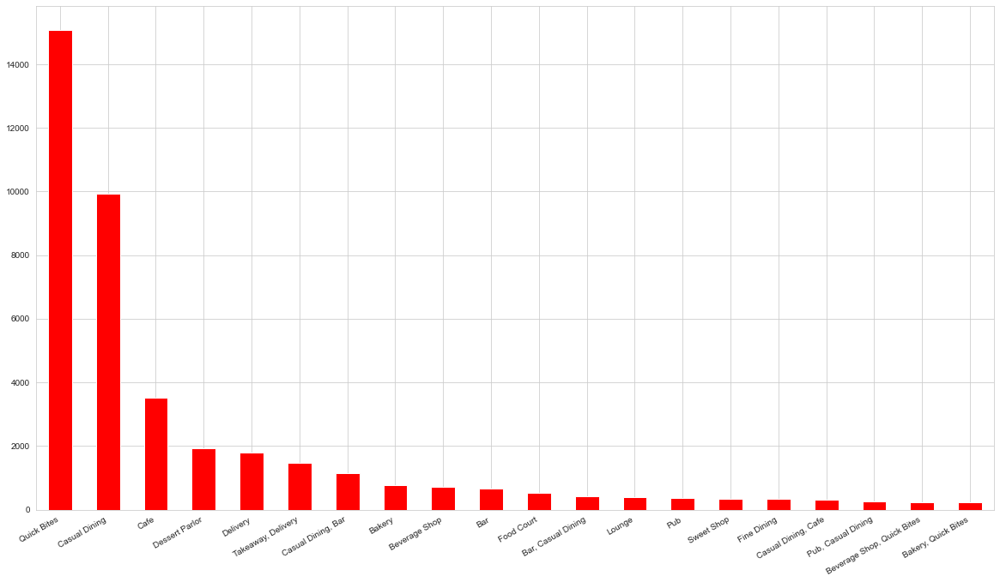

In [49]:
plt.figure(figsize=(20,12))
zomato_df['rest_type'].value_counts().nlargest(20).plot.bar(color='red')
plt.gcf().autofmt_xdate()

In [50]:
# now with plotly
trace1 = go.Bar( 
        x = zomato_df['rest_type'].value_counts().nlargest(20).index,
        y = zomato_df['rest_type'].value_counts().nlargest(20),
        name= 'rest_type')

In [51]:
iplot([trace1])

In [52]:
''' conclusion : At all, Banglore is known as the tech capital of India,people having busy and modern life will prefer Quick Bites.
We can observe tha Quick Bites type restaurants dominates.'''

' conclusion : At all, Banglore is known as the tech capital of India,people having busy and modern life will prefer Quick Bites.\nWe can observe tha Quick Bites type restaurants dominates.'

In [53]:
# highest voted restaurant

<AxesSubplot:xlabel='name'>

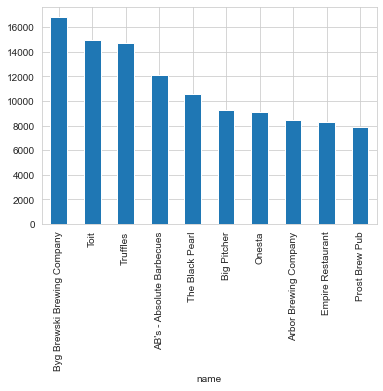

In [54]:
zomato_df.groupby('name')['votes'].max().nlargest(10).plot.bar()

In [55]:
# now using plotly 
trace1 = go.Bar(
    x=zomato_df.groupby('name')['votes'].max().nlargest(10).index,
    y=zomato_df.groupby('name')['votes'].max().nlargest(10),name='name')

In [56]:
iplot([trace1])

In [57]:
# total restaurants at different locations of Bengalore

In [58]:
zomato_df.groupby('location')['name'].unique()

location
BTM                  [Sankranthi Veg Restaurant, Hearts Unlock Cafe...
Banashankari         [Jalsa, Spice Elephant, San Churro Cafe, Addhu...
Banaswadi            [Cafe Nibras, The Sanctuary, Crunch Pizzas, Pi...
Bannerghatta Road    [Deja Vu Resto Bar, Fattoush, Empire Restauran...
Basavanagudi         [Grand Village, Timepass Dinner, Srinathji's C...
                                           ...                        
West Bangalore       [FreshMenu, Fit Dish Fetish, Garden City Mobil...
Whitefield           [Imperio Cafe, Night Diaries, LocalHost, AB's ...
Wilson Garden        [Tree Top, Sahana's (Nati Style), Karavali Kol...
Yelahanka            [Prashanth Naati Corner, Cheta's Kitchen, Twis...
Yeshwantpur          [Chef's Bank, New Agarwal Bhavan, Fishing Boat...
Name: name, Length: 92, dtype: object

In [59]:
restaurant=[]
location=[]
for key,location_df in zomato_df.groupby('location'):
    location.append(key)
    restaurant.append(len(location_df['name'].unique()))

In [60]:
df_total=pd.DataFrame(zip(location,restaurant))
df_total.columns=['location','restaurant']
df_total.set_index('location',inplace=True)
df_total.sort_values(by='restaurant').tail(10)

,restaurant
location,
Bellandur,284
Jayanagar,311
Bannerghatta Road,362
JP Nagar,400
Indiranagar,467
Electronic City,518
Marathahalli,525
HSR,553
BTM,581


<AxesSubplot:xlabel='location'>

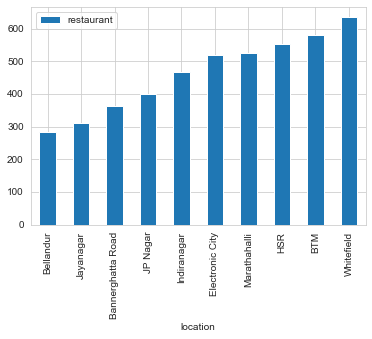

In [61]:
df_total.sort_values(by='restaurant').tail(10).plot.bar()

In [62]:
df_total.sort_values(by='restaurant').tail(10).index

Index(['Bellandur', 'Jayanagar', 'Bannerghatta Road', 'JP Nagar',
       'Indiranagar', 'Electronic City', 'Marathahalli', 'HSR', 'BTM',
       'Whitefield'],
      dtype='object', name='location')

In [63]:
trace1 = go.Bar(x=df_total['restaurant'].nlargest(10).index,y= df_total['restaurant'].nlargest(10),name='priority')

In [64]:
iplot([trace1])

In [65]:
zomato_df.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                               0
votes                              0
phone                            832
location                           0
rest_type                        151
dish_liked                     20333
cuisines                          11
approx_cost(for two people)      252
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [66]:
# different types of restaurant

In [67]:
(zomato_df['rest_type'].value_counts()/len(zomato_df))*100

Quick Bites                   34.302035
Casual Dining                 22.582040
Cafe                           8.026489
Dessert Parlor                 4.412635
Delivery                       4.075827
                                ...    
Dessert Parlor, Food Court     0.004551
Bakery, Food Court             0.004551
Food Court, Beverage Shop      0.004551
Bakery, Beverage Shop          0.004551
Quick Bites, Kiosk             0.002276
Name: rest_type, Length: 87, dtype: float64

In [68]:
# total no. of variety of restaurants (north indian, south indian)

In [69]:
zomato_df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

Text(0.5, 1.0, 'most popular cuisines of bangalore')

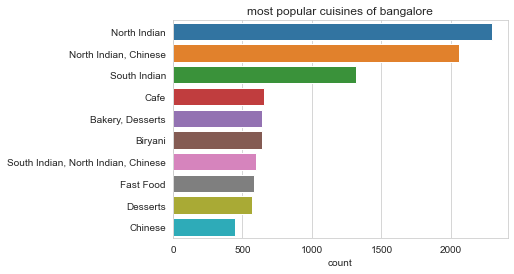

In [70]:
cuisines= zomato_df['cuisines'].value_counts()[0:10]
sns.barplot(cuisines,cuisines.index)
plt.xlabel('count')
plt.title("most popular cuisines of bangalore")

In [71]:
cuisines=zomato_df['cuisines'].value_counts()[:10]
trace1 = go.Bar( 
        x = cuisines.index,
        y = cuisines,
        name= 'Cuisines')

In [72]:
iplot([trace1])

In [73]:
'''' We can observe that North Indian,chinese,South Indian and Biriyani are most common.
It means Bengalore is more influenced by North Indian culture more than South '''

"' We can observe that North Indian,chinese,South Indian and Biriyani are most common.\nIt means Bengalore is more influenced by North Indian culture more than South "

In [74]:
zomato_df['approx_cost(for two people)']

0          800
1          800
2          800
3          300
4          600
         ...  
51709      800
51711      800
51712    1,500
51715    2,500
51716    1,500
Name: approx_cost(for two people), Length: 43942, dtype: object

In [75]:
zomato_df['approx_cost(for two people)'].isnull().sum()

252

In [76]:
zomato_df.dropna(axis='index',subset=['approx_cost(for two people)'],inplace=True)

In [77]:
zomato_df['approx_cost(for two people)'].isnull().sum()

0

In [78]:
zomato_df['approx_cost(for two people)'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '1,700', '1,400', '1,350', '2,200', '2,000',
       '1,800', '1,900', '180', '330', '2,500', '2,100', '3,000', '2,800',
       '3,400', '50', '40', '1,250', '3,500', '4,000', '2,400', '2,600',
       '1,450', '70', '3,200', '560', '240', '360', '6,000', '1,050',
       '2,300', '4,100', '120', '5,000', '3,700', '1,650', '2,700',
       '4,500'], dtype=object)

In [79]:
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True    

In [80]:
zomato_df[~zomato_df['approx_cost(for two people)'].apply(is_float)]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
67,https://www.zomato.com/gustoesbeerhouse?contex...,"10, 30th Main, Deve Gowda Petrol Bunk Road, 3r...",Gustoes Beer House,No,No,4.1,868,080 49653521,Banashankari,Pub,"Beer, Wedges, Pizza, Nachos, Salads, Papaya Sa...","Continental, Italian, Mexican, North Indian, C...","1,200","[('Rated 5.0', 'RATED\n Has a really calm roo...",[],Delivery,Banashankari
119,https://www.zomato.com/bangalore/k27-the-pub-b...,"27, 27th Cross, 2nd Stage, Banashankari, Banga...",K27 - The Pub,No,No,3.1,30,+91 9980097472,Banashankari,Bar,NaN,"Chinese, North Indian","1,000","[('Rated 4.0', ""RATED\n Convenient and Averag...",[],Delivery,Banashankari
166,https://www.zomato.com/bangalore/patio-805-jay...,"805, Ground Floor, 35C Cross, 9th Main, 4th Bl...",Patio 805,Yes,Yes,4.1,364,+91 8884999805,Jayanagar,Casual Dining,"Noodles, Laksa Soup, Coffee, Veg Fritters, Veg...","Thai, Vietnamese, Asian, Chinese","1,200","[('Rated 4.0', ""RATED\n The number of good re...",[],Delivery,Banashankari
207,https://www.zomato.com/bangalore/chutney-chang...,"Cosmopolitan Club, 22nd Cross, 3rd Block, Jaya...",Chutney Chang,Yes,Yes,4.1,2339,080 22443007\r\n+91 9901967373,Jayanagar,Casual Dining,"Veg Momos, Brownie Chocolate, Palak Chaat, Mut...","North Indian, Chinese, BBQ","1,500","[('Rated 4.0', 'RATED\n Great place for team ...",[],Delivery,Banashankari
217,https://www.zomato.com/bangalore/toscano-jayan...,"359/38,Next to Fabindia, 7th Cross, 1st Block,...",Toscano,Yes,Yes,4.3,1129,080 41558423\r\n+91 7619320074,Jayanagar,Casual Dining,"Pizza, Pasta, Salads, Calamari, Ravioli, Pumpk...","Italian, Salad","1,300","[('Rated 4.0', 'RATED\n Saturday Night Dinner...",[],Delivery,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51707,https://www.zomato.com/bangalore/m-bar-bengalu...,"Bengaluru Marriott Hotel, 75, 8th Road, EPIP A...",M Bar - Bengaluru Marriott Hotel Whitefield,No,No,3.9,77,080 49435000,Whitefield,"Fine Dining, Bar",Rooftop Ambience,Finger Food,"2,000","[('Rated 4.0', 'RATED\n Went there post dinne...",[],Pubs and bars,Whitefield
51708,https://www.zomato.com/bangalore/keys-cafe-key...,"Keys Hotel, 6, 1st Phase Industrial Area, Near...",Keys Cafe - Keys Hotel,No,No,2.8,161,080 39451000\n+91 8884038484,Whitefield,"Casual Dining, Bar","Salads, Coffee, Breakfast Buffet, Halwa, Chick...","Chinese, Continental, North Indian","1,200","[('Rated 3.0', 'RATED\n Place is good not tha...",[],Pubs and bars,Whitefield
51712,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6,27,080 40301477,Whitefield,Bar,NaN,Continental,"1,500","[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500","[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


In [81]:
zomato_df['approx_cost(for two people)'].dtype

dtype('O')

In [82]:
# now remove "," and convert them to integer

In [83]:
zomato_df['approx_cost(for two people)'] = zomato_df['approx_cost(for two people)'].apply(lambda x: x.replace(',',''))

In [84]:
zomato_df['approx_cost(for two people)'] = zomato_df['approx_cost(for two people)'].astype(int)

In [85]:
zomato_df['approx_cost(for two people)'].dtype

dtype('int32')

In [86]:
# cost vs rating

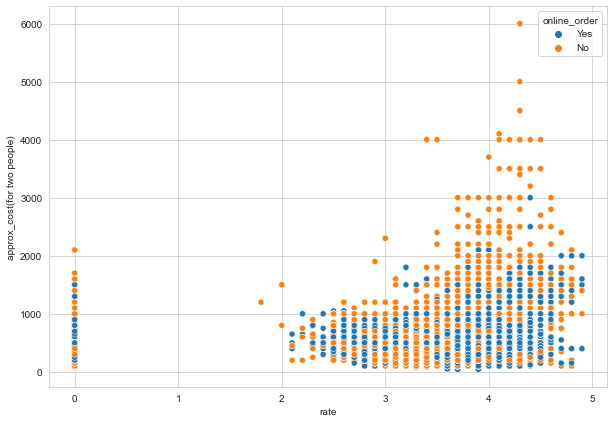

In [87]:
plt.figure(figsize=(10,7))
sns.scatterplot(x='rate', y='approx_cost(for two people)',hue='online_order',data= zomato_df)
plt.show()

In [88]:
''' from this scattterplot,we can come up with a conclusion ya most of the highest rated accepts online order and they r budgeted too  '''

' from this scattterplot,we can come up with a conclusion ya most of the highest rated accepts online order and they r budgeted too  '

In [89]:
# Is there any difference b/w votes of restaurants accepting and not accepting online orders?

<AxesSubplot:xlabel='online_order', ylabel='votes'>

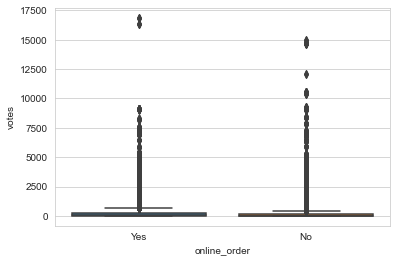

In [90]:
sns.boxplot(x='online_order',y='votes',data=zomato_df)

In [91]:
''' from this boxplot,we can observe that median number of votes for both categories vary.
Restaurants accepting online orders get more votes from customers as there is a rating option poping up after each order through zomato application. '''

' from this boxplot,we can observe that median number of votes for both categories vary.\nRestaurants accepting online orders get more votes from customers as there is a rating option poping up after each order through zomato application. '

In [92]:
# Is there any difference b/w price of restaurants accepting and not accepting online orders?

<AxesSubplot:xlabel='online_order', ylabel='approx_cost(for two people)'>

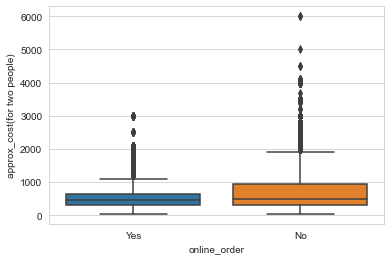

In [93]:
sns.boxplot(x='online_order',y='approx_cost(for two people)',data=zomato_df)

In [94]:
fig = px.box(zomato_df,x='online_order',y='approx_cost(for two people)')
fig.show()

In [95]:
''' Restaurants accepting online orders are more affordable than Restaurants who are accepting online orders '''

' Restaurants accepting online orders are more affordable than Restaurants who are accepting online orders '

In [96]:
# cheapest rate for 2 people
zomato_df['approx_cost(for two people)'].min()

40

In [97]:
# most pricy for 2 people
zomato_df['approx_cost(for two people)'].max()

6000

In [98]:
zomato_df[zomato_df['approx_cost(for two people)'] == 6000]

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
19139,https://www.zomato.com/bangalore/le-cirque-sig...,"The Leela Palace, 23, Old Airport Road, Bangalore",Le Cirque Signature - The Leela Palace,No,Yes,4.3,126,080 30571234\r\n080 30571540,Old Airport Road,Fine Dining,"Wine, Asparagus Soup, Creme Brulee, Pasta, Rav...","French, Italian",6000,"[('Rated 5.0', 'RATED\n Awesome would be an u...",[],Dine-out,Indiranagar
45618,https://www.zomato.com/bangalore/le-cirque-sig...,"The Leela Palace, 23, Old Airport Road, Bangalore",Le Cirque Signature - The Leela Palace,No,Yes,4.3,128,080 30571234\n080 30571540,Old Airport Road,Fine Dining,"Wine, Asparagus Soup, Creme Brulee, Pasta, Rav...","French, Italian",6000,"[('Rated 5.0', 'RATED\n Awesome would be an u...",[],Dine-out,Old Airport Road


In [99]:
zomato_df[zomato_df['approx_cost(for two people)'] == 6000]['name']

19139    Le Cirque Signature - The Leela Palace
45618    Le Cirque Signature - The Leela Palace
Name: name, dtype: object

In [100]:
# distribution of cost for 2 people

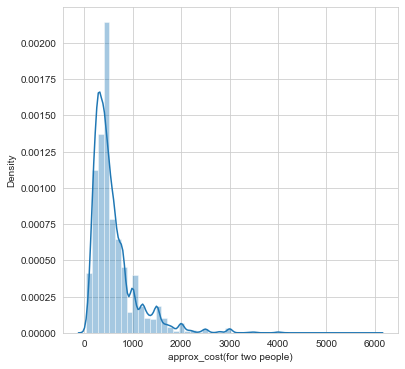

In [101]:
plt.figure(figsize=(6,6))
sns.distplot(zomato_df['approx_cost(for two people)'])
plt.show()

In [102]:
px.histogram(zomato_df,x='approx_cost(for two people)')

In [103]:
''' most of the price lies between in a range of under 1000,it means most are affordable & very few are luxurious '''

' most of the price lies between in a range of under 1000,it means most are affordable & very few are luxurious '

In [104]:
 # Most costly Rate for 2 people is served at which Restaurant what exactly is the dish involved in this and liked dish of that restaurant

In [105]:
zomato_df[zomato_df['approx_cost(for two people)']==6000].loc[:,('name','cuisines','dish_liked')]

,name,cuisines,dish_liked
19139,Le Cirque Signature - The Leela Palace,"French, Italian","Wine, Asparagus Soup, Creme Brulee, Pasta, Rav..."
45618,Le Cirque Signature - The Leela Palace,"French, Italian","Wine, Asparagus Soup, Creme Brulee, Pasta, Rav..."


In [106]:
zomato_df[zomato_df['approx_cost(for two people)']==6000][['name','cuisines','dish_liked']]

,name,cuisines,dish_liked
19139,Le Cirque Signature - The Leela Palace,"French, Italian","Wine, Asparagus Soup, Creme Brulee, Pasta, Rav..."
45618,Le Cirque Signature - The Leela Palace,"French, Italian","Wine, Asparagus Soup, Creme Brulee, Pasta, Rav..."


In [107]:
data=zomato_df.copy()

In [108]:
data.dtypes

url                             object
address                         object
name                            object
online_order                    object
book_table                      object
rate                           float64
votes                            int64
phone                           object
location                        object
rest_type                       object
dish_liked                      object
cuisines                        object
approx_cost(for two people)      int32
reviews_list                    object
menu_item                       object
listed_in(type)                 object
listed_in(city)                 object
dtype: object

In [110]:
data.set_index('name',inplace=True)

<AxesSubplot:xlabel='name'>

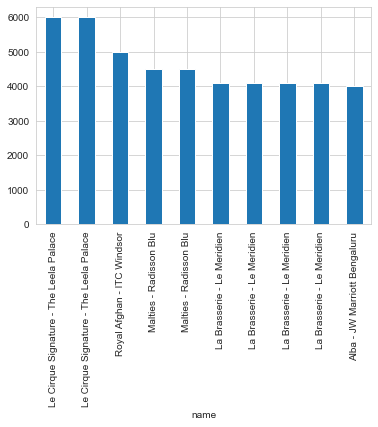

In [111]:
# top 10 most expensive restaurant with approx cost for two peoples
data['approx_cost(for two people)'].nlargest(10).plot.bar()

In [115]:
trace1 = go.Bar( 
        x = data['approx_cost(for two people)'].nlargest(10).index,
        y = data['approx_cost(for two people)'].nlargest(10),
        name= 'Priority')
iplot([trace1])

<AxesSubplot:xlabel='name'>

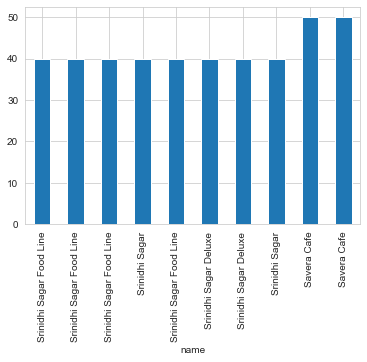

In [118]:
# Top 10 Cheapest restaurant with approx cost for 2 people
data['approx_cost(for two people)'].nsmallest(10).plot.bar()

In [122]:
trace1 = go.Bar(
    x= data['approx_cost(for two people)'].nsmallest(10).index,
    y=data['approx_cost(for two people)'].nsmallest(10),
    name = 'priority')
iplot([trace1])                

In [123]:
# Top 10 Cheapest restaurant location wise with approx cost for 2 people
data.set_index('location',inplace=True)
data['approx_cost(for two people)'].nsmallest(10)

location
Indiranagar         40
Indiranagar         40
Indiranagar         40
Old Airport Road    40
Indiranagar         40
Domlur              40
Domlur              40
Old Airport Road    40
Shivajinagar        50
Shivajinagar        50
Name: approx_cost(for two people), dtype: int32

In [124]:
# all the restautant that are below than 500(budget hotel)
data[data['approx_cost(for two people)']<=500]

,url,address,online_order,book_table,rate,votes,phone,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
location,,,,,,,,,,,,,,,
Banashankari,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",No,No,3.7,88,+91 9620009302,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
Banashankari,https://www.zomato.com/bangalore/caf%C3%A9-dow...,"12,29 Near PES University Back Gate, D'Souza N...",Yes,No,4.1,402,080 26724489\r\n+91 7406048982,Cafe,"Waffles, Pasta, Crispy Chicken, Honey Chilli C...",Cafe,500,"[('Rated 4.0', 'RATED\n We ended up here on a...",[],Cafes,Banashankari
Banashankari,https://www.zomato.com/bangalore/the-coffee-sh...,"6th Block, 3rd Stage, Banashankari, Bangalore",Yes,Yes,4.2,164,+91 9731644212,Cafe,"Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sa...","Cafe, Chinese, Continental, Italian",500,"[('Rated 4.0', ""RATED\n Food - 4/5\nAmbience ...",[],Cafes,Banashankari
Banashankari,https://www.zomato.com/bangalore/caf-eleven-ba...,"111, Sapphire Toys Building, 100 Feet Ring Roa...",No,No,4.0,424,080 49577715,Cafe,"Sandwich, Omelette, Ice Tea, Virgin Mojito, Ho...","Cafe, Continental",450,"[('Rated 2.0', ""RATED\n This is a hookah cafe...",[],Cafes,Banashankari
Banashankari,https://www.zomato.com/bangalore/t3h-cafe-bana...,"504, CJ Venkata Das Road, Padmanabhangar, 2nd ...",No,No,3.9,93,+91 8884726600,Cafe,"Cheese Maggi, Peri Peri Fries, Pasta Arrabiata","Cafe, Italian, American",300,"[('Rated 4.0', ""RATED\n Happy to see such a c...",[],Cafes,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Brookefield,https://www.zomato.com/bangalore/venice-kerala...,"Opposite Brookfield Mall, Shiva Temple Road, B...",No,No,3.7,34,+91 8880059495,Quick Bites,NaN,Kerala,200,"[('Rated 5.0', 'RATED\n Loved this restaurant...",[],Dine-out,Whitefield
KR Puram,https://www.zomato.com/bangalore/thai-chinese-...,"7, Anurhh Arcade, Hoodi Road, Kodigehalli Road...",No,No,3.4,7,+91 9206260085\n+91 7619416923,Quick Bites,NaN,"Chinese, Thai",400,"[('Rated 5.0', 'RATED\n Its Looking delicious...",[],Dine-out,Whitefield
Brookefield,https://www.zomato.com/bangalore/the-crunch-br...,"33/1, Kundalahalli Road, Brookefield, Bangalore",No,No,3.3,6,+91 9016277963,Beverage Shop,NaN,Beverages,300,"[('Rated 3.0', 'RATED\n the sandwich was not ...",[],Dine-out,Whitefield


In [125]:
df_budget=data[data['approx_cost(for two people)']<=500].loc[:,('approx_cost(for two people)')]
df_budget=df_budget.reset_index()
df_budget.head()

,location,approx_cost(for two people)
0,Banashankari,300
1,Banashankari,500
2,Banashankari,500
3,Banashankari,450
4,Banashankari,300


<AxesSubplot:>

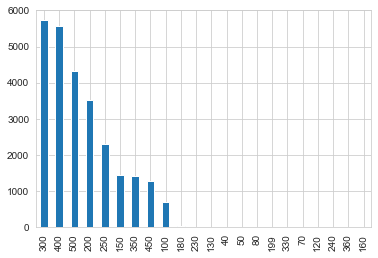

In [126]:
df_budget['approx_cost(for two people)'].value_counts().plot.bar()

In [ ]:
'''we can conclude that 300 and 400 cost dishes are maximum in count'''

In [127]:
trace1 = go.Bar( 
        x = df_budget['approx_cost(for two people)'].value_counts().index,
        y = df_budget['approx_cost(for two people)'].value_counts(),
        name= 'Priority')
iplot([trace1])

In [129]:
# Restaurants that have better rating >4 and that are under budget too
zomato_df[(zomato_df['rate']>=4) & (zomato_df['approx_cost(for two people)']<=500)].shape

(4007, 17)

In [138]:
# Total no. of Restaurants that have better rating >4 and that are under budget too ie less than 500
df_new = zomato_df[(zomato_df['rate']>=4) & (zomato_df['approx_cost(for two people)']<=500)]

In [139]:
len(df_new['name'].unique())

628

In [140]:
location=[]
total=[]
for loc,location_df in df_new.groupby('location'):
    location.append(loc)
    total.append(len(location_df['name'].unique()))

In [141]:
len(location)

68

In [142]:
len(total)


68

In [143]:
location_df=pd.DataFrame(zip(location,total))
location_df.columns=['location','restaurant']
location_df.set_index('location',inplace=True)

In [144]:
location_df.head(10)

,restaurant
location,
BTM,54
Banashankari,25
Banaswadi,3
Bannerghatta Road,19
Basavanagudi,31
Basaveshwara Nagar,3
Bellandur,20
Brigade Road,11
Brookefield,16


Text(0, 0.5, 'Total restaurants')

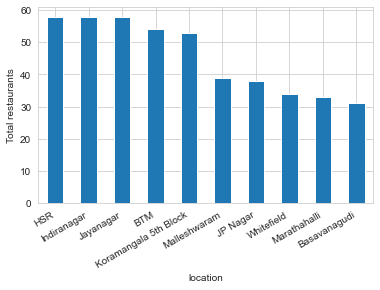

In [146]:
location_df['restaurant'].nlargest(10).plot.bar()
plt.gcf().autofmt_xdate()
plt.ylabel('Total restaurants')

In [147]:
trace1 = go.Bar( 
        x = location_df['restaurant'].nlargest(10).index,
        y = location_df['restaurant'].nlargest(10),
        name= 'Priority')
iplot([trace1])

In [148]:
# To Visualise what are the names of those hotels
location=[]
total=[]
for loc,location_df in df_new.groupby('location'):
    location.append(loc)
    total.append(location_df['name'].unique())

In [149]:
afford=pd.DataFrame(zip(location,total))
afford.columns=['location','res_names']
afford.set_index('location',inplace=True)
afford.head()

,res_names
location,
BTM,"[eat.fit, Hiyar Majhe Kolkata, XO Belgian Waff..."
Banashankari,[CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The ...
Banaswadi,"[Pooja Dosa Camp, Corner House Ice Cream, The ..."
Bannerghatta Road,"[BOX8- Desi Meals, Krishna Kuteera, Krishna Ku..."
Basavanagudi,"[Kabab Magic, Sri Guru Kottureshwara Davangere..."


In [153]:
# Finding Best budget Restaurants in any location
def return_budget(location,restaurant):
    budget=zomato_df[(zomato_df['approx_cost(for two people)']<=400) & (zomato_df['location']==location) & (zomato_df['rate']>4) & (zomato_df['rest_type']==restaurant)]
    return(budget['name'].unique())

In [154]:
return_budget('BTM',"Quick Bites")

array(['Swadista Aahar', 'Litti Twist', 'The Shawarma Shop', 'Gorbandh',
       'Yum In My Tum', 'Chaatimes', "Muthashy's", 'Swad Punjab Da',
       "Domino's Pizza", 'Roti Wala', 'Andhra Kitchen'], dtype=object)

<AxesSubplot:xlabel='location'>

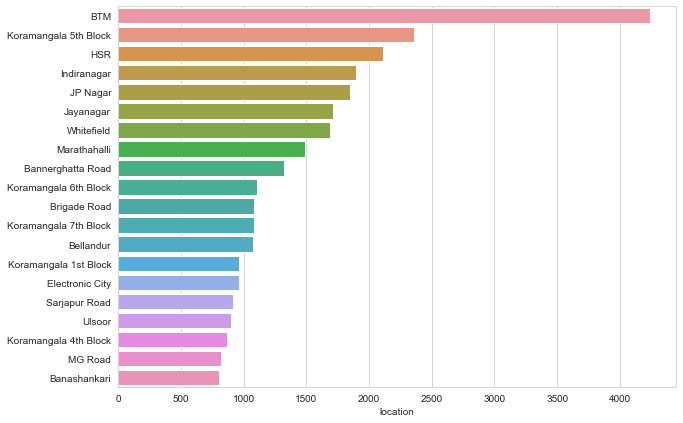

In [157]:
# Which are the foodie areas?
plt.figure(figsize=(10,7))
Restaurant_locations=zomato_df['location'].value_counts()[:20]
sns.barplot(Restaurant_locations,Restaurant_locations.index)

In [158]:
Restaurant_locations=zomato_df['location'].value_counts()[:20]
trace1 = go.Bar( 
        x = Restaurant_locations.index,
        y = Restaurant_locations,
        name= 'Priority')
iplot([trace1])

In [159]:
''' We can see that BTM,HSR and Koranmangala 5th block has the most number of restaurants.
BTM dominates the section by having more than 5000 restaurants. '''

' We can see that BTM,HSR and Koranmangala 5th block has the most number of restaurants.\nBTM dominates the section by having more than 5000 restaurants. '

In [160]:
# Geographical analysis 

In [ ]:
''' Requirement : I need Latitudes & longitudes for each of the place for geaographical Data analysis,so to fetch lat,lon of each place,i have used Geopy  '''

In [161]:
!pip install geopy

In [5]:
len(zomato_df['location'].unique())

94

In [6]:
unique_location_of_resturant=pd.DataFrame({"Name":zomato_df['location'].unique()})

In [7]:
unique_location_of_resturant

,Name
0,Banashankari
1,Basavanagudi
2,Mysore Road
3,Jayanagar
4,Kumaraswamy Layout
...,...
89,West Bangalore
90,Magadi Road
91,Yelahanka
92,Sahakara Nagar


In [8]:
unique_location_of_resturant['New_Name'] = 'Bangalore '+unique_location_of_resturant['Name']

In [9]:
unique_location_of_resturant

,Name,New_Name
0,Banashankari,Bangalore Banashankari
1,Basavanagudi,Bangalore Basavanagudi
2,Mysore Road,Bangalore Mysore Road
3,Jayanagar,Bangalore Jayanagar
4,Kumaraswamy Layout,Bangalore Kumaraswamy Layout
...,...,...
89,West Bangalore,Bangalore West Bangalore
90,Magadi Road,Bangalore Magadi Road
91,Yelahanka,Bangalore Yelahanka
92,Sahakara Nagar,Bangalore Sahakara Nagar


In [10]:
from geopy.geocoders import Nominatim

In [11]:
lat_lon=[]
geolocator=Nominatim(user_agent="app")
for location in unique_location_of_resturant['Name']:
    location = geolocator.geocode(location)
    if location is None:
        lat_lon.append(np.nan)
    else:    
        geo=(location.latitude,location.longitude)
        lat_lon.append(geo)

In [12]:
unique_location_of_resturant['geo_loc']=lat_lon

In [13]:
unique_location_of_resturant.to_csv('zomato_locations.csv',index=False)

In [ ]:
''' we will use these latitude and longitude of each location listed in the dataset using geopy to plot maps.'''

In [14]:
Rest_locations=pd.DataFrame(zomato_df['location'].value_counts().reset_index())
Rest_locations.columns=['Name','count']
Rest_locations.tail()

,Name,count
88,West Bangalore,6
89,Yelahanka,6
90,Jakkur,3
91,Rajarajeshwari Nagar,2
92,Peenya,1


In [15]:
Restaurant_locations=Rest_locations.merge(unique_location_of_resturant,on='Name',how="left").dropna()
Restaurant_locations.tail(10)

,Name,count,New_Name,geo_loc
83,North Bangalore,14,Bangalore North Bangalore,"(13.0217151, 77.7660547)"
84,Hebbal,14,Bangalore Hebbal,"(13.0382184, 77.5919)"
85,Nagarbhavi,9,Bangalore Nagarbhavi,"(12.9546741, 77.5121724)"
86,Kengeri,9,Bangalore Kengeri,"(12.9176571, 77.4837568)"
87,Central Bangalore,8,Bangalore Central Bangalore,"(13.0101286, 77.5548006)"
88,West Bangalore,6,Bangalore West Bangalore,"(12.9306281, 77.5857408)"
89,Yelahanka,6,Bangalore Yelahanka,"(13.1006982, 77.5963454)"
90,Jakkur,3,Bangalore Jakkur,"(13.0784743, 77.6068938)"
91,Rajarajeshwari Nagar,2,Bangalore Rajarajeshwari Nagar,"(12.9274413, 77.5155224)"
92,Peenya,1,Bangalore Peenya,"(13.0329419, 77.5273253)"


In [17]:
Restaurant_locations.shape

(92, 4)

In [18]:
type(Restaurant_locations['geo_loc'][0])

tuple

In [19]:
def generateBaseMap(default_location=[12.97, 77.59], default_zoom_start=12):
    base_map = folium.Map(location=default_location, zoom_start=default_zoom_start)
    return base_map

In [21]:
Restaurant_locations.isna().sum()

Name        0
count       0
New_Name    0
geo_loc     0
dtype: int64

In [26]:
Restaurant_locations['geo_loc'][0]

(45.9560231, -112.498564)

In [27]:
np.array(Restaurant_locations['geo_loc'])

array([(45.9560231, -112.498564), (18.1475, 41.538889),
       (13.2923988, 77.7519261), (12.2655944, 76.6465404),
       (44.3730577, -71.6118577), (12.9732913, 77.6404672),
       (27.64392675, 83.05280519687284), (12.9552572, 77.6984163),
       (12.9106394, 77.6000462), (12.93577245, 77.66676103753434),
       (-8.6368007, 115.2147012), (12.9355425, 77.6128717),
       (40.28745, -76.964526), (13.2923988, 77.7519261),
       (13.2923988, 77.7519261), (12.9244803, 77.6502737),
       (12.9778793, 77.6246697), (12.93433385, 77.63040639553275),
       (29.4534927, -98.6440138), (15.8876779, 75.7046777),
       (13.0221416, 77.6403368), (50.7721586, 0.09772783661369303),
       (12.996845, 77.6130165), (13.0027353, 77.5703253),
       (12.9417261, 77.5755021), (38.7385916, -77.5275749),
       (13.0141618, 77.6518539), (33.5935063, -79.0345627),
       (13.0346384, 77.5681733), (13.0093455, 77.6377094),
       (12.9882338, 77.554883), (51.373656, -0.1042366),
       (40.7652844, -76.37

In [28]:
#### unzip it
lat,lon=zip(*np.array(Restaurant_locations['geo_loc']))

In [29]:
type(lat)

tuple

In [30]:
type(lon)

tuple

In [31]:
Restaurant_locations['lat']=lat
Restaurant_locations['lon']=lon

In [32]:
Restaurant_locations.head()

,Name,count,New_Name,geo_loc,lat,lon
0,BTM,5124,Bangalore BTM,"(45.9560231, -112.498564)",45.956023,-112.498564
1,HSR,2523,Bangalore HSR,"(18.1475, 41.538889)",18.147500,41.538889
2,Koramangala 5th Block,2504,Bangalore Koramangala 5th Block,"(13.2923988, 77.7519261)",13.292399,77.751926
3,JP Nagar,2235,Bangalore JP Nagar,"(12.2655944, 76.6465404)",12.265594,76.646540
4,Whitefield,2144,Bangalore Whitefield,"(44.3730577, -71.6118577)",44.373058,-71.611858


In [33]:
!pip install folium


You should consider upgrading via the 'c:\users\pawan\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip' command.


In [34]:
import folium
from folium.plugins import HeatMap
basemap=generateBaseMap()

In [36]:
Restaurant_locations[['lat','lon','count']].values.tolist()

[[45.9560231, -112.498564, 5124.0],
 [18.1475, 41.538889, 2523.0],
 [13.2923988, 77.7519261, 2504.0],
 [12.2655944, 76.6465404, 2235.0],
 [44.3730577, -71.6118577, 2144.0],
 [12.9732913, 77.6404672, 2083.0],
 [27.64392675, 83.05280519687284, 1926.0],
 [12.9552572, 77.6984163, 1846.0],
 [12.9106394, 77.6000462, 1630.0],
 [12.93577245, 77.66676103753434, 1286.0],
 [-8.6368007, 115.2147012, 1258.0],
 [12.9355425, 77.6128717, 1238.0],
 [40.28745, -76.964526, 1218.0],
 [13.2923988, 77.7519261, 1181.0],
 [13.2923988, 77.7519261, 1156.0],
 [12.9244803, 77.6502737, 1065.0],
 [12.9778793, 77.6246697, 1023.0],
 [12.93433385, 77.63040639553275, 1017.0],
 [29.4534927, -98.6440138, 918.0],
 [15.8876779, 75.7046777, 906.0],
 [13.0221416, 77.6403368, 853.0],
 [50.7721586, 0.09772783661369303, 812.0],
 [12.996845, 77.6130165, 727.0],
 [13.0027353, 77.5703253, 725.0],
 [12.9417261, 77.5755021, 684.0],
 [38.7385916, -77.5275749, 675.0],
 [13.0141618, 77.6518539, 664.0],
 [33.5935063, -79.0345627, 658.0]

In [37]:
HeatMap(Restaurant_locations[['lat','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)

In [38]:
basemap

In [ ]:
# It is clear that restaurants tend to concentrate in central bangalore area.
# The clutter of restaurants lowers are we move away from central.
# So,potential restaurant entrepreneurs can refer this and find out good locations for their venture.

In [ ]:
# Heatmap of North Indian restaurants

In [39]:
df2= zomato_df[zomato_df['cuisines']=='North Indian']
df2.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
5,https://www.zomato.com/bangalore/timepass-dinn...,"37, 5-1, 4th Floor, Bosco Court, Gandhi Bazaar...",Timepass Dinner,Yes,No,3.8/5,286,+91 9980040002\r\n+91 9980063005,Basavanagudi,Casual Dining,"Onion Rings, Pasta, Kadhai Paneer, Salads, Sal...",North Indian,600,"[('Rated 3.0', 'RATED\n Food 3/5\nAmbience 3/...",[],Buffet,Banashankari
50,https://www.zomato.com/bangalore/petoo-banasha...,"276, Ground Floor, 100 Feet Outer Ring Road, B...",Petoo,No,No,3.7/5,21,+91 8026893211,Banashankari,Quick Bites,NaN,North Indian,450,"[('Rated 2.0', 'RATED\n This is a neatly made...",[],Delivery,Banashankari
72,https://www.zomato.com/bangalore/spicy-tandoor...,"Opposite ICICi Bank, Hanuman Nagar, Banashanka...",Spicy Tandoor,No,No,NEW,0,+91 8050884222,Banashankari,Quick Bites,NaN,North Indian,150,"[('Rated 4.0', 'RATED\n cost for chicken roll...",[],Delivery,Banashankari
87,https://www.zomato.com/bangalore/krishna-sagar...,"38, 22nd Main, 22nd Cross, Opposite BDA, 2nd S...",Krishna Sagar,No,No,3.5/5,31,+91 8892752997\r\n+91 7204780429,Banashankari,Quick Bites,NaN,North Indian,200,"[('Rated 1.0', 'RATED\n Worst experience with...",[],Delivery,Banashankari
94,https://www.zomato.com/bangalore/nandhini-delu...,"304, Opposite Apollo Public School, 100 Feet R...",Nandhini Deluxe,No,No,2.6/5,283,080 26890011\r\n080 26890033,Banashankari,Casual Dining,"Biryani, Chicken Guntur, Thali, Buttermilk, Ma...",North Indian,600,"[('Rated 3.0', 'RATED\n Ididnt like much.\n\n...",[],Delivery,Banashankari


In [40]:
north_india=df2.groupby(['location'],as_index=False)['url'].agg('count')
north_india.columns=['Name','count']
north_india.head()

,Name,count
0,BTM,340
1,Banashankari,36
2,Banaswadi,12
3,Bannerghatta Road,75
4,Basavanagudi,21


In [41]:
north_india=north_india.merge(unique_location_of_resturant,on="Name",how='left').dropna()

In [42]:
north_india.head()

,Name,count,New_Name,geo_loc
0,BTM,340,Bangalore BTM,"(45.9560231, -112.498564)"
1,Banashankari,36,Bangalore Banashankari,"(15.8876779, 75.7046777)"
2,Banaswadi,12,Bangalore Banaswadi,"(13.0141618, 77.6518539)"
3,Bannerghatta Road,75,Bangalore Bannerghatta Road,"(12.9106394, 77.6000462)"
4,Basavanagudi,21,Bangalore Basavanagudi,"(12.9417261, 77.5755021)"


In [43]:
north_india['lan'],north_india['lon']=zip(*north_india['geo_loc'].values)

In [44]:
basemap=generateBaseMap()
HeatMap(north_india[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

In [ ]:
# heat map for South Indian cuisines

In [45]:
df3= zomato_df[zomato_df['cuisines']=='South Indian']
south_india=df3.groupby(['location'],as_index=False)['url'].agg('count')
south_india.columns=['Name','count']
south_india=south_india.merge(unique_location_of_resturant,on="Name",how='left').dropna()
south_india['lan'],south_india['lon']=zip(*south_india['geo_loc'].values)

In [46]:
basemap=generateBaseMap()
HeatMap(south_india[['lan','lon','count']].values.tolist(),zoom=20,radius=15).add_to(basemap)
basemap

In [ ]:
#  Which are the most popular casual dining restaurant chains?

In [47]:
df_1=zomato_df.groupby(['rest_type','name']).agg('count')
datas=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False).head(3))['url'].reset_index().rename(columns={'url':'count'})

In [48]:
datas

,level_0,rest_type,name,count
0,0,Bakery,Just Bake,49
1,0,Bakery,INDULGE by InnerChef,32
2,0,Bakery,Warm Oven,28
3,1,"Bakery, Beverage Shop",Arya S.L.Bakery,6
4,1,"Bakery, Beverage Shop",Sapna's Magic Oven,5
...,...,...,...,...
211,91,Takeaway,TheRiceBowl.In,8
212,91,Takeaway,Lassi Berg,7
213,92,"Takeaway, Delivery",The Good Bowl,30
214,92,"Takeaway, Delivery",BOX8- Desi Meals,27


In [49]:
df_1=zomato_df.groupby(['rest_type','name']).agg('count')
df_1

url  address  online_order  \
rest_type          name                                                      
Bakery             7th Heaven                     2        2             2   
                   A Baker's Confession           4        4             4   
                   A Little For Love              1        1             1   
                   A1 Express                     3        3             3   
                   Adarsh Bakery                  2        2             2   
...                                             ...      ...           ...   
Takeaway, Delivery Yummy Beeriyaniz               1        1             1   
                   Zamorin's Mappillah Biryani    1        1             1   
                   Zu's Doner Kebaps              1        1             1   
                   eat.fit                        2        2             2   
                   sCoolMeal                      5        5             5   

                                                book_table  rate  votes  \
rest_type          name                                                   
Bakery             7th Heaven                            2     2      2   
                   A Baker's Confession                  4     0      4   
                   A Little For Love                     1     1      1   
                   A1 Express                            3     0      3   
                   Adarsh Bakery                         2     2      2   
...                                                    ...   ...    ...   
Takeaway, Delivery Yummy Beeriyaniz                      1     0      1   
                   Zamorin's Mappillah Biryani           1     1      1   
                   Zu's Doner Kebaps                     1     1      1   
                   eat.fit                               2     2      2   
                   sCoolMeal                             5     0      5   

                                                phone  location  dish_liked  \
rest_type          name                                                       
Bakery             7th Heaven                       2         2           0   
                   A Baker's Confession             4         4           0   
                   A Little For Love                1         1           0   
                   A1 Express                       3         3           0   
                   Adarsh Bakery                    2         2           0   
...                                               ...       ...         ...   
Takeaway, Delivery Yummy Beeriyaniz                 1         1           0   
                   Zamorin's Mappillah Biryani      1         1           0   
                   Zu's Doner Kebaps                0         1           0   
                   eat.fit                          2         2           0   
                   sCoolMeal                        5         5           0   

                                                cuisines  \
rest_type          name                                    
Bakery             7th Heaven                          2   
                   A Baker's Confession                4   
                   A Little For Love                   1   
                   A1 Express                          3   
                   Adarsh Bakery                       2   
...                                                  ...   
Takeaway, Delivery Yummy Beeriyaniz                    1   
                   Zamorin's Mappillah Biryani         1   
                   Zu's Doner Kebaps                   1   
                   eat.fit                             2   
                   sCoolMeal                           5   

                                                approx_cost(for two people)  \
rest_type          name                                                       
Bakery             7th Heaven                                             2   
           

In [50]:
df_1.sort_values(['url'],ascending=False)

url  address  online_order  \
rest_type           name                                                       
Cafe                Cafe Coffee Day                96       96            96   
Casual Dining, Cafe Onesta                         85       85            85   
Quick Bites         Five Star Chicken              69       69            69   
                    Domino's Pizza                 60       60            60   
                    McDonald's                     59       59            59   
...                                               ...      ...           ...   
                    Sri Devi Cafe                   1        1             1   
Dessert Parlor      Mr Gola                         1        1             1   
Quick Bites         Sri Bhagya Veg                  1        1             1   
                    Sri Basaveswara Hilige Mane     1        1             1   
                    Sri Sairam's Chats and Juice    1        1             1   

                                                  book_table  rate  votes  \
rest_type           name                                                    
Cafe                Cafe Coffee Day                       96    89     96   
Casual Dining, Cafe Onesta                                85    85     85   
Quick Bites         Five Star Chicken                     69    67     69   
                    Domino's Pizza                        60    60     60   
                    McDonald's                            59    59     59   
...                                                      ...   ...    ...   
                    Sri Devi Cafe                          1     1      1   
Dessert Parlor      Mr Gola                                1     1      1   
Quick Bites         Sri Bhagya Veg                         1     1      1   
                    Sri Basaveswara Hilige Mane            1     0      1   
                    Sri Sairam's Chats and Juice           1     1      1   

                                                  phone  location  dish_liked  \
rest_type           name                                                        
Cafe                Cafe Coffee Day                  89        96          31   
Casual Dining, Cafe Onesta                           85        85          85   
Quick Bites         Five Star Chicken                64        69          10   
                    Domino's Pizza                   60        60          55   
                    McDonald's                       59        59          57   
...                                                 ...       ...         ...   
                    Sri Devi Cafe                     1         1           0   
Dessert Parlor      Mr Gola                           1         1           0   
Quick Bites         Sri Bhagya Veg                    1         1           0   
                    Sri Basaveswara Hilige Mane       1         1           0   
                    Sri Sairam's Chats and Juice      1         1           1   

                                                  cuisines  \
rest_type           name                                     
Cafe                Cafe Coffee Day                     96   
Casual Dining, Cafe Onesta                              85   
Quick Bites         Five Star Chicken                   69   
                    Domino's Pizza                      60   
                    McDonald's                          59   
...                                                    ...   
                    Sri Devi Cafe                        1   
Dessert Parlor      Mr Gola                              1   
Quick Bites         Sri Bhagya Veg                       1   
                    Sri Basaveswara Hilige Mane          1   
                    Sri Sairam's Chats and Juice         1   

                                                  approx_cost(for two people)  \
rest_type           name                                         

In [51]:
df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False))

url  address  online_order  \
   rest_type          name                                                  
0  Bakery             Just Bake                 49       49            49   
                      INDULGE by InnerChef      32       32            32   
                      Warm Oven                 28       28            28   
                      Karachi Bakery            27       27            27   
                      CakeZone                  21       21            21   
...                                            ...      ...           ...   
92 Takeaway, Delivery True South                 1        1             1   
                      Farida's Kitchen           1        1             1   
                      Hunger Genie               1        1             1   
                      Hyderabadi Biryaani Hub    1        1             1   
                      Sadi's Biriyani            1        1             1   

                                               book_table  rate  votes  phone  \
   rest_type          name                                                      
0  Bakery             Just Bake                        49    44     49     49   
                      INDULGE by InnerChef             32    28     32     32   
                      Warm Oven                        28    28     28     28   
                      Karachi Bakery                   27    26     27     24   
                      CakeZone                         21    21     21     21   
...                                                   ...   ...    ...    ...   
92 Takeaway, Delivery True South                        1     0      1      1   
                      Farida's Kitchen                  1     0      1      1   
                      Hunger Genie                      1     1      1      0   
                      Hyderabadi Biryaani Hub           1     1      1      1   
                      Sadi's Biriyani                   1     1      1      1   

                                               location  dish_liked  cuisines  \
   rest_type          name                                                      
0  Bakery             Just Bake                      49          15        49   
                      INDULGE by InnerChef           32           0        32   
                      Warm Oven                      28           7        28   
                      Karachi Bakery                 27           3        27   
                      CakeZone                       21          10        21   
...                                                 ...         ...       ...   
92 Takeaway, Delivery True South                      1           0         1   
                      Farida's Kitchen                1           0         1   
                      Hunger Genie                    1           1         1   
                      Hyderabadi Biryaani Hub         1           0         1   
                      Sadi's Biriyani                 1           1         1   

                                               approx_cost(for two people)  \
   rest_type          name                                                   
0  Bakery             Just Bake                                         49   
                      INDULGE by InnerChef                              32   
                      Warm Oven                                         28   
                      Karachi Bakery                                    27   
                      CakeZone                                          21   
...                                                                    ...   
92 Takeaway, Delivery True South                                         1   
                      Farida's Kitchen                                   1   
                      Hunger Genie                                       1   
                      Hyderabadi Biryaani Hub                            1   
 

In [52]:
df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False))['url']

    rest_type           name                   
0   Bakery              Just Bake                  49
                        INDULGE by InnerChef       32
                        Warm Oven                  28
                        Karachi Bakery             27
                        CakeZone                   21
                                                   ..
92  Takeaway, Delivery  True South                  1
                        Farida's Kitchen            1
                        Hunger Genie                1
                        Hyderabadi Biryaani Hub     1
                        Sadi's Biriyani             1
Name: url, Length: 9488, dtype: int64

In [53]:
df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False))['url'].reset_index()

,level_0,rest_type,name,url
0,0,Bakery,Just Bake,49
1,0,Bakery,INDULGE by InnerChef,32
2,0,Bakery,Warm Oven,28
3,0,Bakery,Karachi Bakery,27
4,0,Bakery,CakeZone,21
...,...,...,...,...
9483,92,"Takeaway, Delivery",True South,1
9484,92,"Takeaway, Delivery",Farida's Kitchen,1
9485,92,"Takeaway, Delivery",Hunger Genie,1
9486,92,"Takeaway, Delivery",Hyderabadi Biryaani Hub,1


In [54]:
dataset=df_1.sort_values(['url'],ascending=False).groupby(['rest_type'],
                as_index=False).apply(lambda x : x.sort_values(by="url",ascending=False))['url'].reset_index().rename(columns={'url':'count'})

In [55]:
dataset

,level_0,rest_type,name,count
0,0,Bakery,Just Bake,49
1,0,Bakery,INDULGE by InnerChef,32
2,0,Bakery,Warm Oven,28
3,0,Bakery,Karachi Bakery,27
4,0,Bakery,CakeZone,21
...,...,...,...,...
9483,92,"Takeaway, Delivery",True South,1
9484,92,"Takeaway, Delivery",Farida's Kitchen,1
9485,92,"Takeaway, Delivery",Hunger Genie,1
9486,92,"Takeaway, Delivery",Hyderabadi Biryaani Hub,1


In [56]:
casual=dataset[dataset['rest_type']=='Casual Dining']
casual

,level_0,rest_type,name,count
1183,27,Casual Dining,Empire Restaurant,58
1184,27,Casual Dining,Beijing Bites,48
1185,27,Casual Dining,Mani's Dum Biryani,47
1186,27,Casual Dining,Chung Wah,46
1187,27,Casual Dining,Oye Amritsar,41
...,...,...,...,...
2927,27,Casual Dining,Chill,1
2928,27,Casual Dining,Fishland 15,1
2929,27,Casual Dining,Fishland,1
2930,27,Casual Dining,Chillies Restaurant,1


In [58]:
zomato_df.shape

(51717, 17)

In [ ]:
'''We can see tht Empire restaurant,Beijing bites and Mani's dum biriyani are the most popular casual dining restaurant chains in Bangalore. We will inspect them further...'''

In [ ]:

# Where are their outlets located?

In [ ]:
# Wordcloud of dishes liked by cuisines.
from wordcloud import WordCloud

In [59]:
zomato_df['update_dish_liked']=zomato_df['dish_liked'].apply(lambda x : x.split(',') if type(x)==str else [''])

In [60]:
zomato_df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city),update_dish_liked
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari,"[Pasta, Lunch Buffet, Masala Papad, Paneer ..."
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari,"[Momos, Lunch Buffet, Chocolate Nirvana, Th..."
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari,"[Churros, Cannelloni, Minestrone Soup, Hot ..."
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari,[Masala Dosa]
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari,"[Panipuri, Gol Gappe]"


In [61]:
zomato_df['rest_type'].value_counts()[:9].index

Index(['Quick Bites', 'Casual Dining', 'Cafe', 'Delivery', 'Dessert Parlor',
       'Takeaway, Delivery', 'Casual Dining, Bar', 'Bakery', 'Beverage Shop'],
      dtype='object')

In [62]:
rest=zomato_df['rest_type'].value_counts()[:9].index

In [63]:
# create wordcloud for each and every restaurant

In [64]:
from wordcloud import WordCloud, STOPWORDS 

In [65]:
zomato_df.isna().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
update_dish_liked                  0
dtype: int64

In [66]:
zomato_df.dropna(axis='index',subset=['rest_type'],inplace=True)

In [67]:
zomato_df.dropna(axis='index',subset=['dish_liked'],inplace=True)

In [68]:
zomato_df.isna().sum()

url                              0
address                          0
name                             0
online_order                     0
book_table                       0
rate                            30
votes                            0
phone                          337
location                         0
rest_type                        0
dish_liked                       0
cuisines                         0
approx_cost(for two people)    134
reviews_list                     0
menu_item                        0
listed_in(type)                  0
listed_in(city)                  0
update_dish_liked                0
dtype: int64

In [70]:
# wordcloud for 1 restaurant
data=zomato_df[zomato_df['rest_type']=='Quick Bites']

In [71]:
data['dish_liked']

3                                              Masala Dosa
31       Burgers, Lassi, Chicken Grill, Naan, Momos, Ch...
34       Rolls, Veggie Wrap, Chocolate Fantasy, Rice Bo...
40       Dabeli, Faluda, Masala Poori, Sandwiches, Tokr...
42                           Burgers, Fries, Hot Chocolate
                               ...                        
51598                          Potato Fries, Chicken Curry
51601    Rolls, Chicken Tikka Roll, Chicken Bhuna Roll,...
51617                               Coffee, Vada, Mla Dosa
51629                             Fish, Veg Thali, Biryani
51645                                              Burgers
Name: dish_liked, Length: 5289, dtype: object

In [72]:
stopwords=set(STOPWORDS)

(-0.5, 1499.5, 1499.5, -0.5)

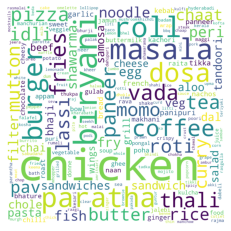

In [73]:
dishes=''
for word in data['dish_liked']:
    words=word.split()
    # Converts each token into lowercase 
    for i in range(len(words)): 
        words[i] = words[i].lower() 
    dishes=dishes+ " ".join(words)+" "
wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,stopwords = stopwords,width=1500, height=1500).generate(dishes)
plt.imshow(wordcloud)
plt.axis("off")

In [76]:
def produce_wordcloud(rest):
    
    plt.figure(figsize=(20,30))
    for i,restaurant in enumerate(rest):
        plt.subplot(3,3,i+1)
        dishes=''
        data=zomato_df[zomato_df['rest_type']==restaurant]
        for word in data['dish_liked']:
            words=word.split()
            # Converts each token into lowercase 
            for i in range(len(words)): 
                words[i] = words[i].lower() 
            dishes=dishes+ " ".join(words)+" "
        wordcloud = WordCloud(max_font_size=None, background_color='white', collocations=False,stopwords = stopwords,width=1500, height=1500).generate(dishes)
        plt.imshow(wordcloud)
        plt.title(restaurant)
        plt.axis("off")

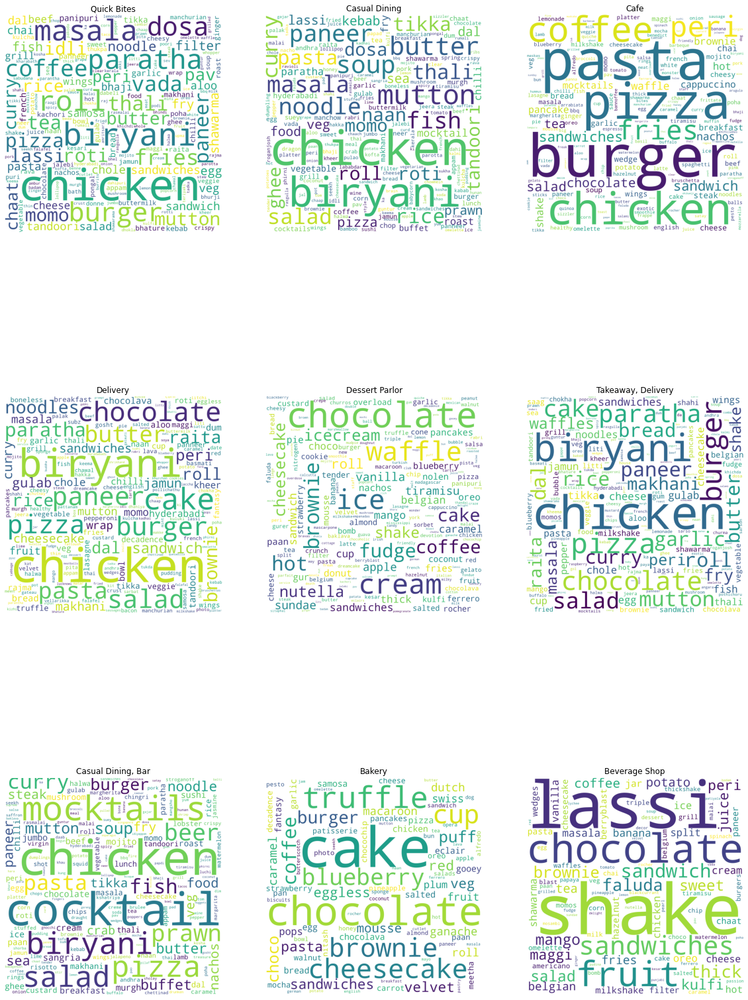

In [77]:
stopwords = set(STOPWORDS) 
produce_wordcloud(rest)

In [78]:
# analysing Reviews of Particular Restaurant
zomato_df['reviews_list'][0]

'[(\'Rated 4.0\', \'RATED\\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.\'), (\'Rated 4.0\', \'RATED\\n  I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\\nCheers\'), (\'Rated 2.0\', \'RATED\\n  Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this plac

In [80]:
data=zomato_df['reviews_list'][0].lower()
data

'[(\'rated 4.0\', \'rated\\n  a beautiful place to dine in.the interiors take you back to the mughal era. the lightings are just perfect.we went there on the occasion of christmas and so they had only limited items available. but the taste and service was not compromised at all.the only complaint is that the breads could have been better.would surely like to come here again.\'), (\'rated 4.0\', \'rated\\n  i was here for dinner with my family on a weekday. the restaurant was completely empty. ambience is good with some good old hindi music. seating arrangement are good too. we ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. food was fresh and good, service is good too. good for family hangout.\\ncheers\'), (\'rated 2.0\', \'rated\\n  its a restaurant near to banashankari bda. me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. on inquiring they said this plac

In [81]:
import re
data2=re.sub('[^a-zA-Z]', ' ',data)
data2

'   rated        rated n  a beautiful place to dine in the interiors take you back to the mughal era  the lightings are just perfect we went there on the occasion of christmas and so they had only limited items available  but the taste and service was not compromised at all the only complaint is that the breads could have been better would surely like to come here again       rated        rated n  i was here for dinner with my family on a weekday  the restaurant was completely empty  ambience is good with some good old hindi music  seating arrangement are good too  we ordered masala papad  panner and baby corn starters  lemon and corrionder soup  butter roti  olive and chilli paratha  food was fresh and good  service is good too  good for family hangout  ncheers      rated        rated n  its a restaurant near to banashankari bda  me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet  on inquiring they said this place is mostly vis

In [82]:
data3=re.sub('rated', ' ',data2)
data3

'              n  a beautiful place to dine in the interiors take you back to the mughal era  the lightings are just perfect we went there on the occasion of christmas and so they had only limited items available  but the taste and service was not compromised at all the only complaint is that the breads could have been better would surely like to come here again                  n  i was here for dinner with my family on a weekday  the restaurant was completely empty  ambience is good with some good old hindi music  seating arrangement are good too  we ordered masala papad  panner and baby corn starters  lemon and corrionder soup  butter roti  olive and chilli paratha  food was fresh and good  service is good too  good for family hangout  ncheers                 n  its a restaurant near to banashankari bda  me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet  on inquiring they said this place is mostly visited by vegetarians  any

In [83]:
data4=re.sub('x',' ',data3)
data4

'              n  a beautiful place to dine in the interiors take you back to the mughal era  the lightings are just perfect we went there on the occasion of christmas and so they had only limited items available  but the taste and service was not compromised at all the only complaint is that the breads could have been better would surely like to come here again                  n  i was here for dinner with my family on a weekday  the restaurant was completely empty  ambience is good with some good old hindi music  seating arrangement are good too  we ordered masala papad  panner and baby corn starters  lemon and corrionder soup  butter roti  olive and chilli paratha  food was fresh and good  service is good too  good for family hangout  ncheers                 n  its a restaurant near to banashankari bda  me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet  on inquiring they said this place is mostly visited by vegetarians  any

In [84]:
# remove multiple spaces

In [85]:
re.sub(' +',' ',data4)

' n a beautiful place to dine in the interiors take you back to the mughal era the lightings are just perfect we went there on the occasion of christmas and so they had only limited items available but the taste and service was not compromised at all the only complaint is that the breads could have been better would surely like to come here again n i was here for dinner with my family on a weekday the restaurant was completely empty ambience is good with some good old hindi music seating arrangement are good too we ordered masala papad panner and baby corn starters lemon and corrionder soup butter roti olive and chilli paratha food was fresh and good service is good too good for family hangout ncheers n its a restaurant near to banashankari bda me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet on inquiring they said this place is mostly visited by vegetarians anyways we ordered ala carte items which took ages to come food was o

In [86]:
# analyse review of a particular restaurant

In [87]:
dataset=zomato_df[zomato_df['rest_type']=='Quick Bites']

In [88]:
type(dataset['reviews_list'][3])

str

In [89]:
total_review=' '
for review in dataset['reviews_list']:
    review=review.lower()
    review=re.sub('[^a-zA-Z]', ' ',review)
    review=re.sub('rated', ' ',review)
    review=re.sub('x',' ',review)
    review=re.sub(' +',' ',review)
    total_review=total_review + str(review)

(-0.5, 799.5, 799.5, -0.5)

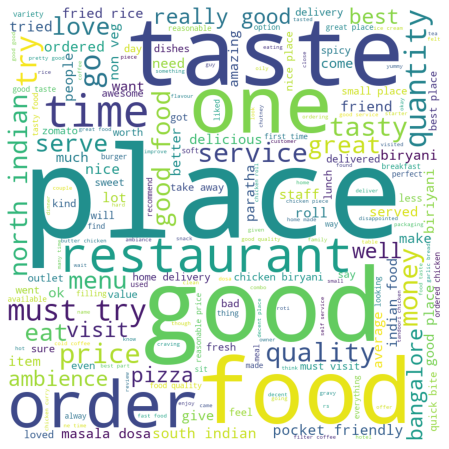

In [90]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(total_review) 
# plot the WordCloud image                        
plt.figure(figsize = (8, 8)) 
plt.imshow(wordcloud) 
plt.axis("off") 

In [93]:
def for_any_one(restaurant_name):
    dataset=zomato_df[zomato_df['rest_type']==restaurant_name]
    total_review=' '
    for review in dataset['reviews_list']:
        review=review.lower()
        review=re.sub('[^a-zA-Z]', ' ',review)
        review=re.sub('rated', ' ',review)
        review=re.sub('x',' ',review)
        review=re.sub(' +',' ',review)
        total_review=total_review + str(review)
    wordcloud = WordCloud(width = 800, height = 800, 
            background_color ='white', 
            stopwords = set(STOPWORDS), 
            min_font_size = 10).generate(total_review) 
    # plot the WordCloud image                        
    plt.figure(figsize = (8, 8)) 
    plt.imshow(wordcloud) 
    plt.axis("off") 

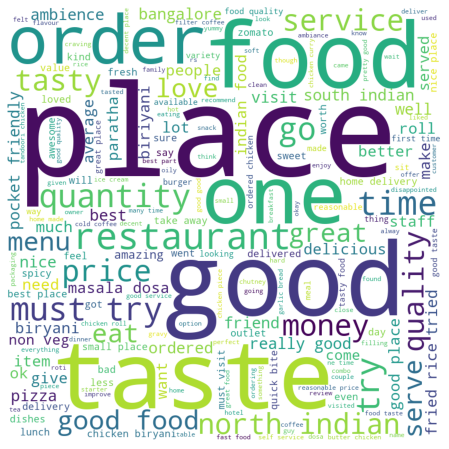

In [94]:
for_any_one('Quick Bites')